<a href="https://colab.research.google.com/github/Rach4r/Rach4r/blob/main/Oral_Cancer_Model_RO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



```

```

# Title: Oral cancer detection using deep learning

The most common form of oral cancer is oral squamous cell carcinoima (OSCC). It is one of the most prevalent cancers worldwide, with a global incidence of more than 350,000 new cases and 177,000 deaths every year which varies geographically based on environmental risk factors.
In this project, I use transfer learning to classify histopathological images of the oral mucosa as either benign (normal) or cancer (OSCC).

In [1]:
# Seed value
# Apparently you may use different seed values at each stage
seed_value= 0

# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)

# 2. Set `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)

# 3. Set `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)

# 4. Set the `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.random.set_seed(seed_value)

In [2]:
%load_ext tensorboard
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tensorflow import keras
import tensorflow_datasets as tfds
from keras import backend as K
import gc
from sklearn import metrics
from collections import Counter
import itertools
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam,SGD
from sklearn.metrics import roc_curve, auc, confusion_matrix
from imblearn.metrics import sensitivity_score, specificity_score
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
from tensorflow.keras.applications.efficientnet import preprocess_input, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from keras.layers import Dense, Input, Activation, add, Add, Dropout, BatchNormalization, GlobalAveragePooling2D
from keras import optimizers

from tqdm import tqdm
from PIL import Image
import requests
import os
import cv2
import glob

import random
from tensorboard.plugins import projector
from shutil import copyfile

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import os
os.chdir('/content')

In [ ]:
!unzip /content/drive/MyDrive/ftmp4cvtmb-1.zip

Archive:  /content/drive/MyDrive/ftmp4cvtmb-1.zip
   creating: Second Set/
   creating: Second Set/400x OSCC Histopathological Images/
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_474.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_393.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_159.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_87.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_195.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_357.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_276.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_438.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_492.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_69.jpg  
  inflating: Second Set/400x OSCC Histopathological Images/OSCC_400x_177.jpg 

In [13]:
def Plot_any(arr, title = ''):
    """
    Plot several pictures
    """
    plt.figure(figsize = (15, 25))
    for i in range(len(arr)):
        plt.subplot(1,len(arr),i + 1)
        plt.title(title)
        plt.imshow(arr[i]);

Loading and Preprocessing of data

In [8]:
# Defining Parameters
IMG_SIZE = 224
CLASSES = 2
BATCH_SIZE = 32

In [9]:
#Transfer 'jpg' images to an array IMG
def Dataset_loader(DIR, RESIZE):
    IMG = []
    read = lambda imname: np.asarray(Image.open(imname).convert("RGB"))
    for IMAGE_NAME in tqdm(os.listdir(DIR)):
        PATH = os.path.join(DIR,IMAGE_NAME)
        _, ftype = os.path.splitext(PATH)
        if ftype == ".jpg":
            img = read(PATH)
            img = cv2.resize(img, (RESIZE,RESIZE))
            IMG.append(np.array(img))
    return IMG

In [10]:
benign_data = np.array(Dataset_loader('/content/drive/MyDrive/Second Set/400x Normal Oral Cavity Histopathological Images',224))

100%|██████████| 201/201 [00:25<00:00,  7.97it/s]


In [11]:
oscc_data = np.array(Dataset_loader('/content/drive/MyDrive/Second Set/400x OSCC Histopathological Images',224))

100%|██████████| 495/495 [01:01<00:00,  8.11it/s]


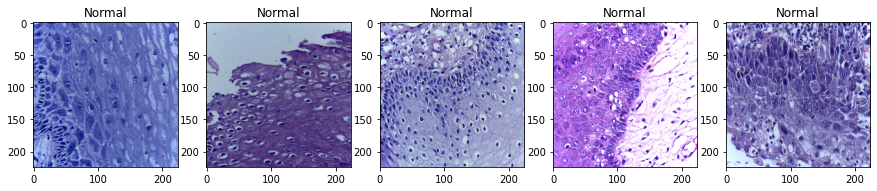

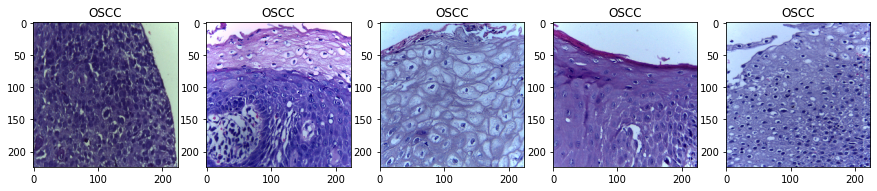

In [14]:
Plot_any(benign_data[:5], title = "Normal")
Plot_any(oscc_data[:5], title = "OSCC")

Create Labels

In [15]:
# Oral Cancer: OSCC vs. Normal
# Create labels
benign_label = np.zeros(len(benign_data))
OSCC_label = np.ones(len(oscc_data))

In [16]:
# Merge data 
X = np.concatenate((benign_data, oscc_data), axis = 0)
Y = np.concatenate((benign_label, OSCC_label), axis = 0)

In [17]:
# Shuffle data
s = np.arange(X.shape[0])
np.random.shuffle(s)
X = X[s]
Y = Y[s]

In [18]:
# To categorical
Y = tf.keras.utils.to_categorical(Y, num_classes= 2)

Train and evaluation split

In [19]:
x_train, x_val, y_train, y_val = train_test_split(
    X, Y, 
    test_size=0.2, 
    random_state=seed_value
)

Display a few images

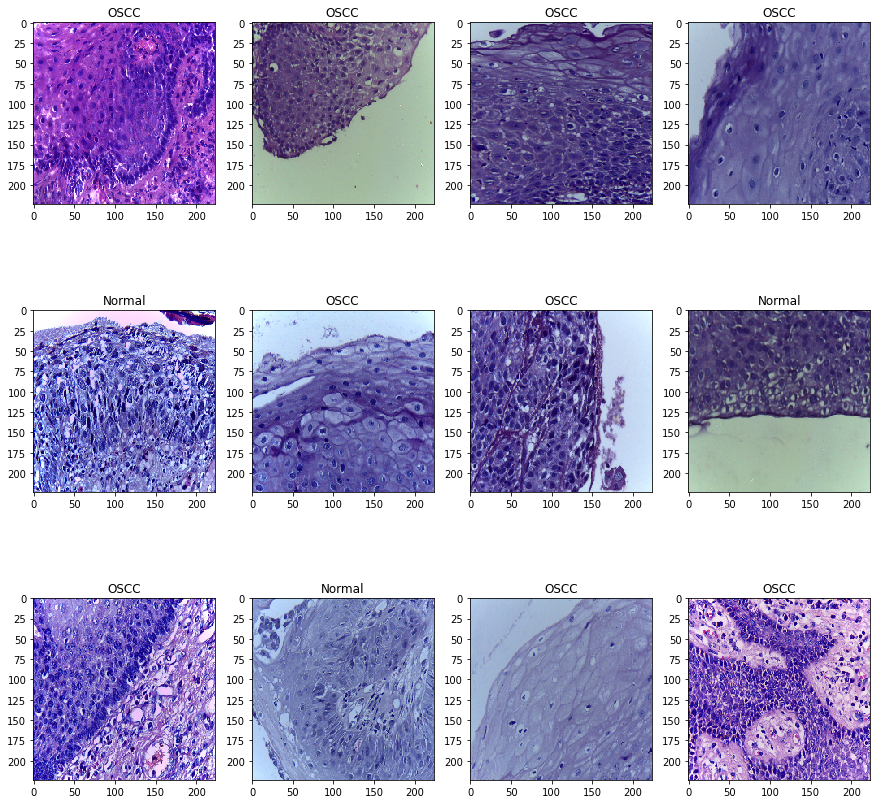

In [20]:
# # Display first 15 images of the oral mucosa, and how they are classified
w=60
h=40
fig=plt.figure(figsize=(15, 15))
columns = 4
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    if np.argmax(Y[i]) == 0:
        ax.title.set_text('Normal')
    else:
        ax.title.set_text('OSCC')
    plt.imshow(x_train[i], interpolation='nearest')
plt.show()

Data generator

In [21]:
train_datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')
val_datagen = ImageDataGenerator()


train_generator = train_datagen.flow(x_train, y_train, batch_size=BATCH_SIZE)

val_generator = val_datagen.flow(x_val,y_val, batch_size=BATCH_SIZE, shuffle= False)

Model

In [126]:
base_model = EfficientNetB0(include_top=False,
                  input_shape = (IMG_SIZE,IMG_SIZE,3),
                  weights = 'imagenet')

base_model.trainable = False

In [127]:
model = tf.keras.Sequential([base_model])
model.add(GlobalAveragePooling2D())
model.add(Dense(2,activation='softmax'))
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 7, 7, 1280)       4049571   
                                                                 
 global_average_pooling2d_8   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_8 (Dense)             (None, 2)                 2562      
                                                                 
Total params: 4,052,133
Trainable params: 2,562
Non-trainable params: 4,049,571
_________________________________________________________________


In [128]:
model.compile(
    loss='categorical_crossentropy',
    optimizer="adam",
    metrics=['accuracy']
)

In [129]:
es_callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=3,restore_best_weights=True)

In [130]:
h = model.fit(train_generator, epochs = 16, verbose = 1, batch_size = 32,
              validation_data  =val_generator,
             callbacks = [es_callback])

Epoch 1/16
18/18 [==============================] - 33s 2s/step - loss: 0.6252 - accuracy: 0.6853 - val_loss: 0.6076 - val_accuracy: 0.6857
Epoch 2/16
18/18 [==============================] - 26s 1s/step - loss: 0.5156 - accuracy: 0.7644 - val_loss: 0.5508 - val_accuracy: 0.7357
Epoch 3/16
18/18 [==============================] - 21s 1s/step - loss: 0.4947 - accuracy: 0.7626 - val_loss: 0.5096 - val_accuracy: 0.7857
Epoch 4/16
18/18 [==============================] - 21s 1s/step - loss: 0.4715 - accuracy: 0.7878 - val_loss: 0.4908 - val_accuracy: 0.7929
Epoch 5/16
18/18 [==============================] - 21s 1s/step - loss: 0.4512 - accuracy: 0.7878 - val_loss: 0.4844 - val_accuracy: 0.7857
Epoch 6/16
18/18 [==============================] - 21s 1s/step - loss: 0.4556 - accuracy: 0.7932 - val_loss: 0.4734 - val_accuracy: 0.7786
Epoch 7/16
18/18 [==============================] - 21s 1s/step - loss: 0.4324 - accuracy: 0.7986 - val_loss: 0.4670 - val_accuracy: 0.7929
Epoch 8/16
18/18 [==

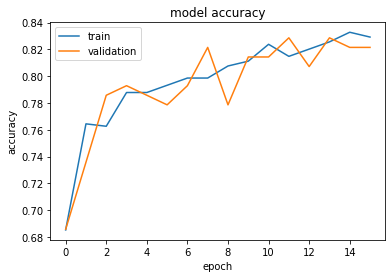

In [131]:
def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()


plot_hist(h)

In [132]:
preds = model.evaluate(x_val,y_val )
print('Loss = ' + str(preds[0]))
print('Validation accuracy = ' + str(preds[1]))

5/5 [==============================] - 5s 715ms/step - loss: 0.4059 - accuracy: 0.8214
Loss = 0.4058791399002075
Validation accuracy = 0.8214285969734192


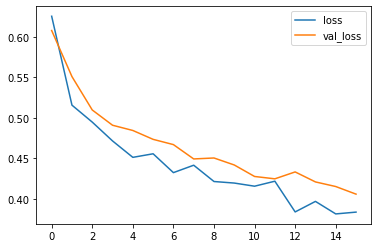

In [260]:
history_df = pd.DataFrame(h.history)
history_df[['loss', 'val_loss']].plot()

In [147]:
import datetime
#creating a logs directory
log_dir = "logm/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [134]:
for layer in model.layers[-3:]:
    layer.trainable = True

In [135]:
# recompile the model
model.compile(optimizer = tf.keras.optimizers.Adam(0.0001), # I use lower learning rate to fine-tune
              loss = tf.keras.losses.categorical_crossentropy,
              metrics = ["accuracy"])

In [148]:
# fit the model using tensorboard
h_1 = model.fit(train_generator, epochs = 22, verbose = 1, batch_size = 32,
              validation_data =val_generator, initial_epoch = 16, callbacks = [tensorboard_callback])

Epoch 17/22
18/18 [==============================] - 102s 5s/step - loss: 0.7144 - accuracy: 0.5935 - val_loss: 0.4708 - val_accuracy: 0.7786
Epoch 18/22
18/18 [==============================] - 86s 5s/step - loss: 0.4364 - accuracy: 0.8040 - val_loss: 0.4982 - val_accuracy: 0.7929
Epoch 19/22
18/18 [==============================] - 85s 5s/step - loss: 0.3340 - accuracy: 0.8831 - val_loss: 0.4739 - val_accuracy: 0.8071
Epoch 20/22
18/18 [==============================] - 86s 5s/step - loss: 0.2913 - accuracy: 0.8939 - val_loss: 0.4526 - val_accuracy: 0.7929
Epoch 21/22
18/18 [==============================] - 84s 5s/step - loss: 0.2288 - accuracy: 0.9281 - val_loss: 0.4048 - val_accuracy: 0.8286
Epoch 22/22
18/18 [==============================] - 87s 5s/step - loss: 0.2002 - accuracy: 0.9424 - val_loss: 0.4080 - val_accuracy: 0.8143


In [152]:
%tensorboard --logdir=logm

<IPython.core.display.Javascript object>

In [150]:
preds2 = model.evaluate(x_val,y_val )
print('Loss = ' + str(preds2[0]))
print('Validation accuracy = ' + str(preds2[1]))

5/5 [==============================] - 5s 686ms/step - loss: 0.4080 - accuracy: 0.8143
Loss = 0.4079640209674835
Validation accuracy = 0.8142856955528259


In [163]:
import pickle
# save model to file
pickle.dump(model, open('model.pkl', 'wb'))

In [281]:
filepath = "/content/drive/MyDrive"

In [298]:
tf.keras.models.save_model(
    model,
    filepath,
    overwrite=True,
    include_optimizer=True,
    save_format=None,
    signatures=None,
    options=None
)


INFO:tensorflow:Assets written to: /content/drive/MyDrive/assets
2022-09-13 03:30:43.899 INFO    tensorflow: Assets written to: /content/drive/MyDrive/assets


In [311]:
cd /content/drive/MyDrive

/content/drive/MyDrive


In [312]:
model.save('my_model')  # creates a HDF5 file 'model.h5'

INFO:tensorflow:Assets written to: my_model/assets
2022-09-13 03:57:36.634 INFO    tensorflow: Assets written to: my_model/assets


In [313]:
model.save("my_h5_model.h5")

Evaluate in Test data (using second set of images)

In [53]:
# Testing set
benign_data_test = np.array(Dataset_loader('/content/drive/MyDrive/Second Set/400x Normal Oral Cavity Histopathological Images',224))
oscc_data_test = np.array(Dataset_loader('/content/drive/MyDrive/Second Set/400x OSCC Histopathological Images',224))

100%|██████████| 495/495 [00:57<00:00,  8.57it/s]


In [247]:
# Oral Cancer: OSCC vs. Normal
# Create labels
benign_test_label = np.zeros(len(benign_data_test))
OSCC_test_label = np.ones(len(oscc_data_test))

In [248]:
# Merge data 
X_test = np.concatenate((benign_data_test, oscc_data_test), axis = 0)
Y_test = np.concatenate((benign_test_label, OSCC_test_label), axis = 0)

In [249]:
# Shuffle data
s_test = np.arange(X_test.shape[0])
np.random.shuffle(s_test)
X_test = X_test[s_test]
Y_test = Y_test[s_test]

In [251]:
# To categorical
Y_test = tf.keras.utils.to_categorical(Y_test, num_classes= 2)

In [252]:
y_pred = model.predict(X_test)


In [255]:
 y_pred=np.argmax(y_pred, axis=1)

In [256]:
 y_true=np.argmax(Y_test, axis=1)

In [253]:
# Import the modules from `sklearn.metrics` 
from sklearn.metrics import confusion_matrix,accuracy_score, precision_score, recall_score, f1_score
accuracy_score(np.argmax(Y_test, axis=1), np.argmax(y_pred, axis=1))

0.8448275862068966

In [257]:
print(precision_score(y_true, y_pred)) 

print(recall_score(y_true, y_pred)) 

print(f1_score(y_true,y_pred))

0.9754299754299754
0.802020202020202
0.8802660753880266


In [62]:
#Defining function for confusion matrix plot
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

#Print Confusion matrix
    fig, ax = plt.subplots(figsize=(7,7))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
        xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

   # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax
np.set_printoptions(precision=2) 

Confusion matrix, without normalization


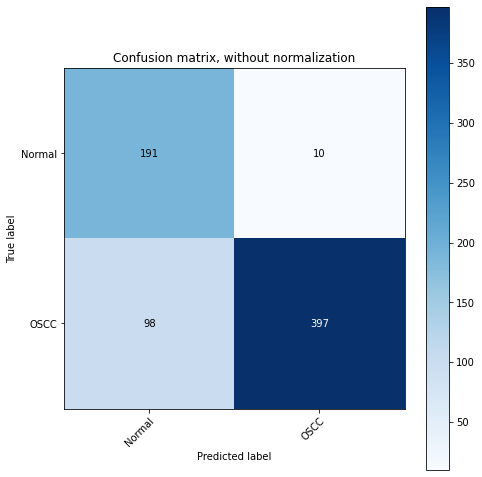

In [258]:
confusion_mtx=confusion_matrix(y_true,y_pred)

class_names=['Normal', 'OSCC']

# Plotting non-normalized confusion matrix
plot_confusion_matrix(y_true, y_pred, classes = class_names,title = 'Confusion matrix, without normalization')

Normalized confusion matrix


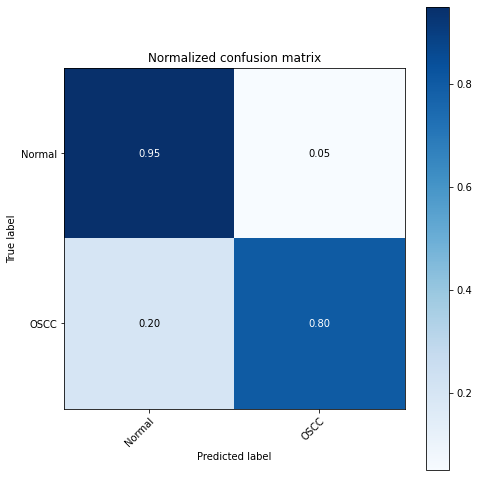

In [259]:
# Plotting normalized confusion matrix
plot_confusion_matrix(y_true, y_pred, classes=class_names, normalize=True, title='Normalized confusion matrix')

My model rightly predicts 80% of OSCC cases and 95% of normal mucosa.

Load model

In [199]:
# Oral Cancer: OSCC vs. Normal
# Create labels
benign_test_label = np.zeros(len(benign_data_test))
OSCC_test_label = np.ones(len(oscc_data_test))

In [200]:
# Merge data 
X_test = np.concatenate((benign_data_test, oscc_data_test), axis = 0)
Y_test = np.concatenate((benign_test_label, OSCC_test_label), axis = 0)

In [201]:
# Shuffle data
s_test = np.arange(X_test.shape[0])
np.random.shuffle(s_test)
X_test = X_test[s_test]
Y_test = Y_test[s_test]

In [203]:
test =np.array(X_test)

In [191]:
# To categorical
Y_test = tf.keras.utils.to_categorical(Y_test, num_classes= 2)

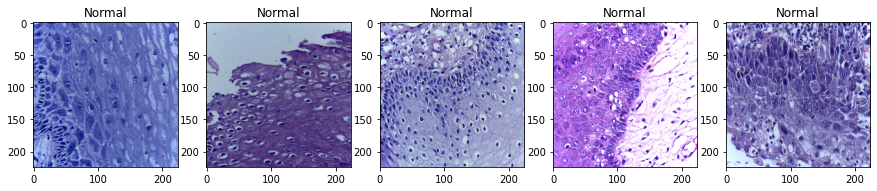

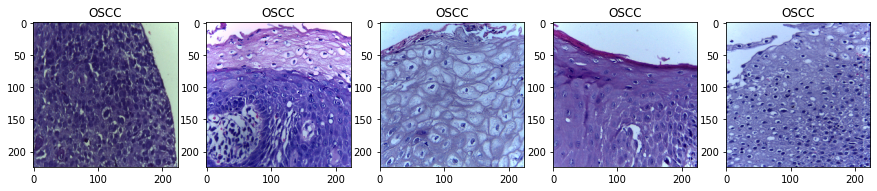

In [179]:
#Plot some of our test data
Plot_any(benign_data_test[:5], title = "Normal")
Plot_any(oscc_data_test[:5], title = "OSCC")

In [261]:
from keras import models

In [264]:
!pip install flask-ngrok

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Change directory to saved model directory

In [262]:
!pip install pyngrok==4.1.1
!ngrok authtoken 2EblfS0Nfs3ntgJTUEF5VmiSmaW_7xM2MQrjhKYNNM4zjP3Uo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pyngrok: filename=pyngrok-4.1.1-py3-none-any.whl size=15983 sha256=df83865a85e35d25f5bfbb29117f373ac08ce5d00710788c3606d4aaf762f03b
  Stored in directory: /root/.cache/pip/wheels/b1/d9/12/045a042fee3127dc40ba6f5df2798aa2df38c414bf533ca765
Successfully built pyngrok
Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


In [265]:
from pyngrok import ngrok
from flask_ngrok import run_with_ngrok
from flask import Flask, render_template, request
import numpy as np
import pickle
import warnings
warnings.filterwarnings('ignore')

In [345]:
!mkdir templates

In [346]:
cd templates

/content/drive/MyDrive/templates


In [347]:
!mkdir index

In [348]:
!jupyter nbconvert --to html /content/drive/MyDrive/templates/index/index.ipynb  

[NbConvertApp] Converting notebook /content/drive/MyDrive/templates/index/index.ipynb to html
[NbConvertApp] Writing 271684 bytes to /content/drive/MyDrive/templates/index/index.html


In [376]:
# create flask app
app = Flask(__name__, template_folder='.')
#run flask app with ngrok
run_with_ngrok(app)

In [378]:
model =pickle.load(open('/content/drive/MyDrive/templates/model.pkl', 'rb'))

In [379]:
@app.route('/', methods=['GET'])
def index():
  return render_template('/content/drive/MyDrive/templates/index/index.html')

In [380]:
from bs4 import BeautifulSoup

# Open test.html for reading
with open('/content/drive/MyDrive/templates/index/index.html') as html_file:
    soup = BeautifulSoup(html_file.read(), features='html.parser')
for title in soup.find_all('title'):
        title.string.replace_with('Oral mucosa lesions: Normal vs OSCC')

In [381]:
html_file = open("/content/drive/MyDrive/templates/index/index.html", "w")

In [382]:
html_file.write(str(soup))

271652

In [383]:
@app.route('/', methods=['GET', "POST"])
def predict():
  input_values = [float(x) for x in request.form.values()]
  inp_features = [input_values]
  prediction = model.predict(X_test)
  if prediction==1:
    return render_template('/content/drive/MyDrive/templates/index/index.html', prediction_text='My model predicts that the patient has OSCC!')
  else:
    return render_template('/content/drive/MyDrive/templates/index/index.html', prediction_text='My model predicts that the patient has a normal oral mucosa!')

app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


INFO:werkzeug: * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)
2022-09-13 05:31:06.647  * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://611a-34-73-247-133.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


ERROR:__main__:Exception on / [GET]
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.7/dist-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1936, in dispatch_request
    return self.view_functions[rule.endpoint](**req.view_args)
  File "<ipython-input-379-08e2cf531ca9>", line 3, in index
    return render_template('/content/drive/MyDrive/templates/index/index.html')